# 평가문항	상세기준
1. 인물모드 사진을 성공적으로 제작하였다.	아웃포커싱 효과가 적용된 인물모드 사진과 동물 사진, 배경전환 크로마키사진을 각각 1장 이상 성공적으로 제작하였다.
2. 제작한 인물모드 사진들에서 나타나는 문제점을 정확히 지적하였다.	인물사진에서 발생한 문제점을 정확히 지적한 사진을 제출하였다.
3. 인물모드 사진의 문제점을 개선할 수 있는 솔루션을 적절히 제시하였다.	semantic segmentation mask의 오류를 보완할 수 있는 좋은 솔루션을 이유와 함께 제시하였다.


In [1]:
# importlib: 사용자가 파이썬의 import 시스템과 상호작용하기 위한 API를 제공하는 내장 라이브러리
# 사용자는 import 함수의 구현 내용과, 실행에 필요한 하위 함수들을 이용해 필요에 맞는 임포터를 직접 구현하거나 임포트 관련 기능들을 자유롭게 사용할 수 있음
# importlib.metadata: 설치된 패키지 메타 데이터에 대한 접근을 제공하는 라이브러리.
# 해당 코드 블럭에서는 importlib.metadata 안에 있는 version() 함수를 이용하여 pixellib 라이브러리의 버전을 확인

from importlib.metadata import version
import cv2
import pixellib
import os
import matplotlib.pyplot as plt
import urllib.request
from pixellib.semantic import semantic_segmentation
import numpy as np 

print(cv2.__version__)
print(version('pixellib'))

4.5.3
0.7.1


# 1. 인물사진

(1080, 1440, 3)


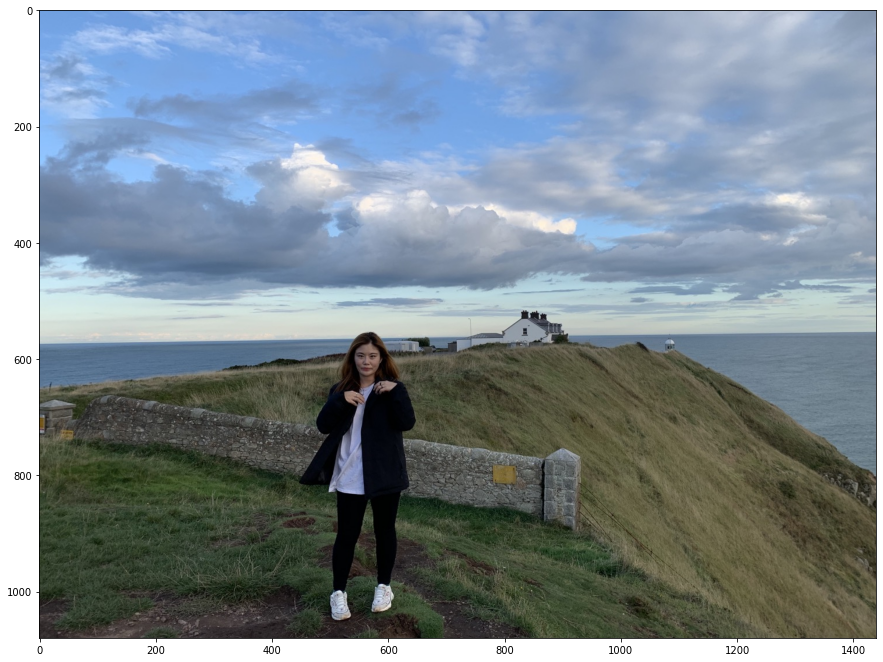

In [2]:
# os 모듈에 있는 getenv() 함수를 이용하여 읽고싶은 파일의 경로를 file_path에 저장
# 준비한 이미지 파일의 경로를 이용하여, 이미지 파일을 읽음
# cv2.imread(경로): 경로에 해당하는 이미지 파일을 읽어서 변수에 저장
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/bit2.jpeg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 이미지 색상 채널을 변경 (BGR 형식을 RGB 형식으로 변경)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시, 입력은 RGB(A) 데이터 혹은 2D 스칼라 데이터
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html
# plt.show(): 현재 열려있는 모든 figure를 표시 (여기서 figure는 이미지, 그래프 등)
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.show.html
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

# PixelLib에서 제공해주는 모델을 다운로드

In [3]:
# 저장할 파일 이름을 결정합니다
# 1. os.getenv(x)함수는 환경 변수x의 값을 포함하는 문자열 변수를 반환합니다. model_dir 에 "/aiffel/human_segmentation/models" 저장
# 2. #os.path.join(a, b)는 경로를 병합하여 새 경로 생성 model_file 에 "/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5" 저장
# 1
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
# 2
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file) # urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해서 model_url에 있는 파일을 다운로드 해서 model_file 파일명으로 저장

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f4482bce940>)

# 다운로드 한 모델을 이용해 PixelLib로 세그멘테이션 모델 생성

In [4]:
model = semantic_segmentation() #PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model.load_pascalvoc_model(model_file) # pascal voc에 대해 훈련된 예외 모델(model_file)을 로드하는 함수를 호출

segvalues, output = model.segmentAsPascalvoc(img_path)# segmentAsPascalvoc()함수를 호출하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용

In [5]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv' #tv는 20
]
len(LABEL_NAMES)

21

# 'person'라벨, 즉 15 영역만 검출함

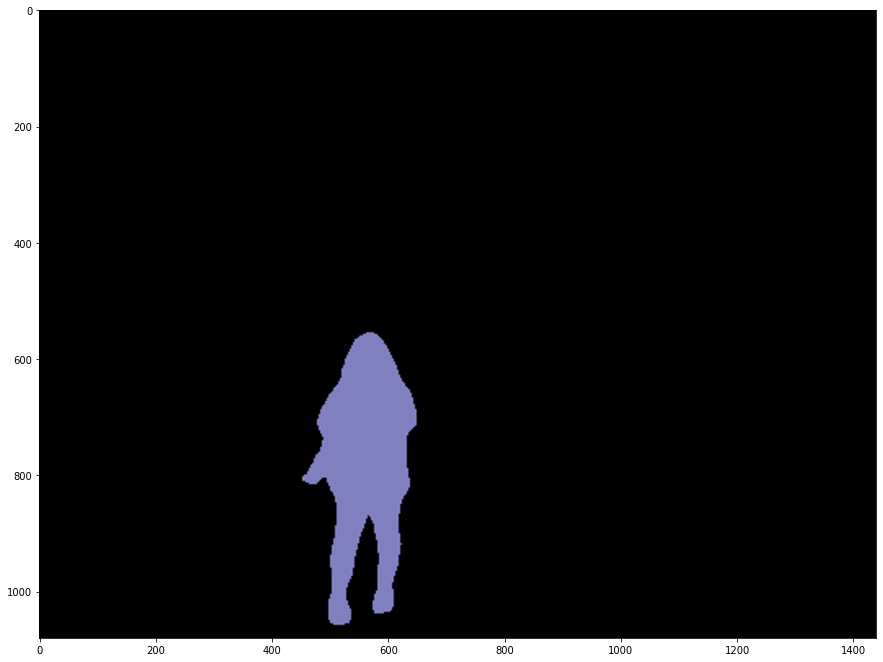

background
person


In [6]:
#segmentAsPascalvoc() 함수 를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
plt.figure(figsize=(15,15))
plt.imshow(output)
plt.show()

segvalues # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 배열값을 출력

#segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

In [7]:
#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [8]:
colormap[15] #컬러맵 15에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 15번째인 사람)

array([192, 128, 128])

#  색상순서 변경 - colormap의 배열은 RGB 순이며 output의 배열은 BGR 순서로 채널 배치

In [9]:
seg_color = (128,128,192) #위에 나온 array를 RGB->BGR 순서로 반대로 작성해줌

# seg_color 로 이루어진 마스크 생성

(1080, 1440)


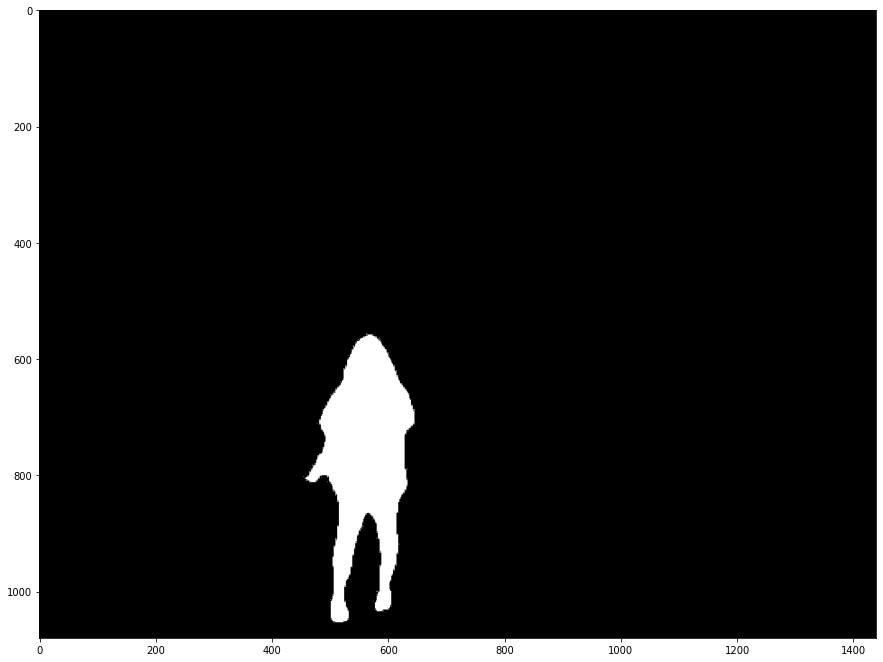

In [10]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape)
plt.figure(figsize=(15,15))
plt.imshow(seg_map, cmap='gray')
plt.show()

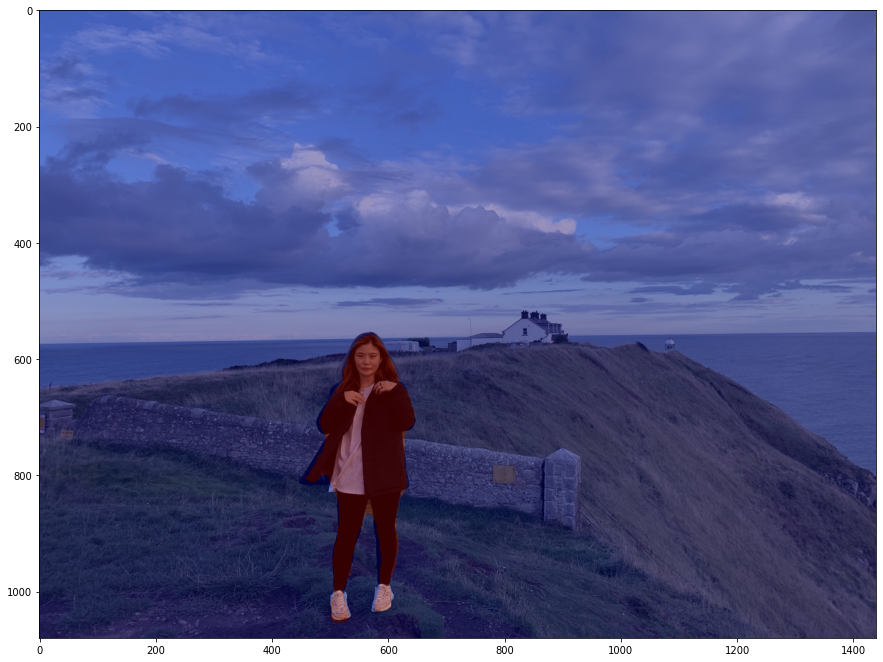

In [11]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

# 이번에는 blur() 함수를 이용해 배경을 흐리게 만듦

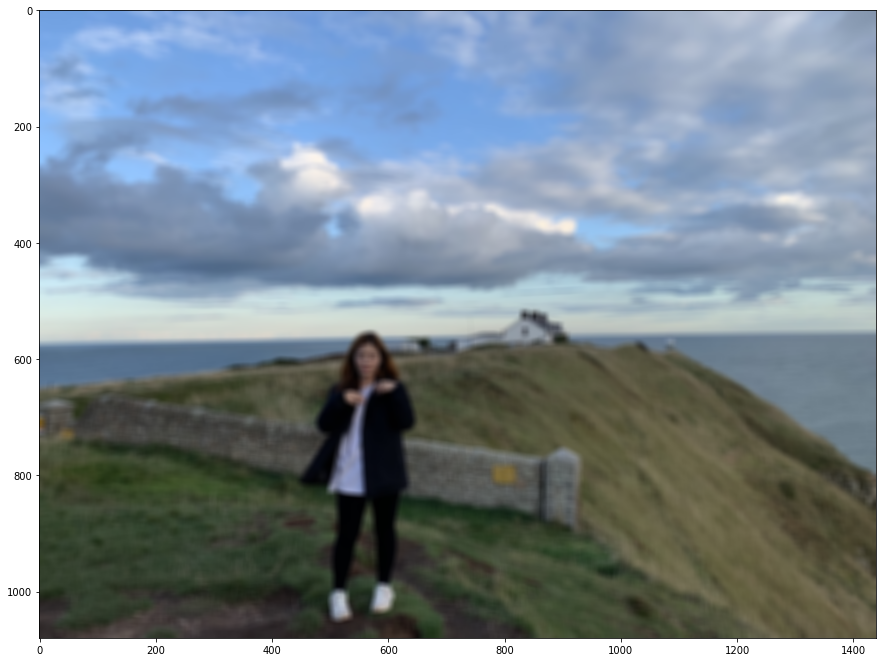

In [12]:
# (13,13)은 blurring kernel size를 뜻합니다
img_orig_blur = cv2.blur(img_orig, (13,13))

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

# 흐려진 이미지에서 세그멘테이션 마스크를 이용해서 배경만 추출

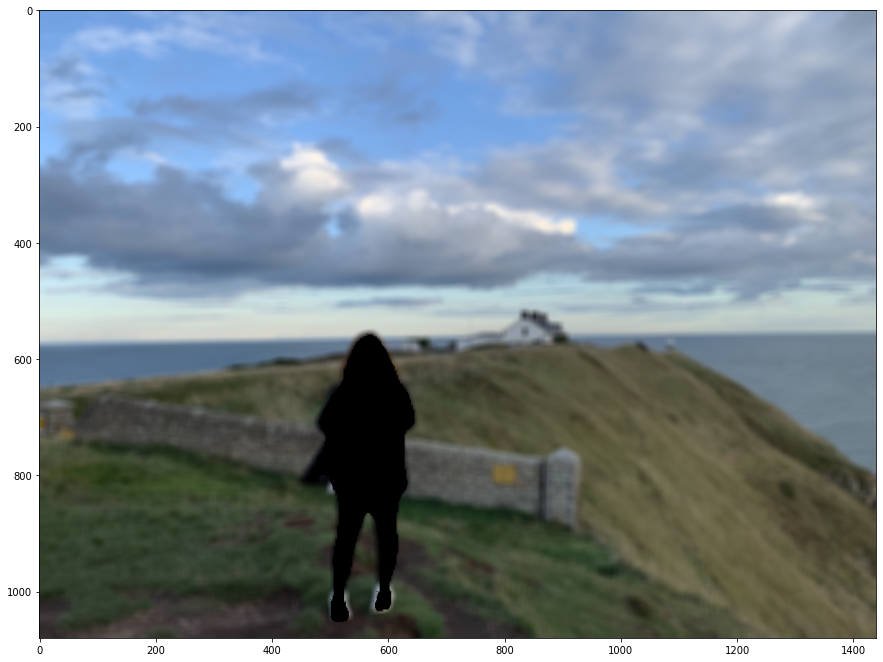

In [13]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_color)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

# 배경 영상과 사람 영상을 합치기

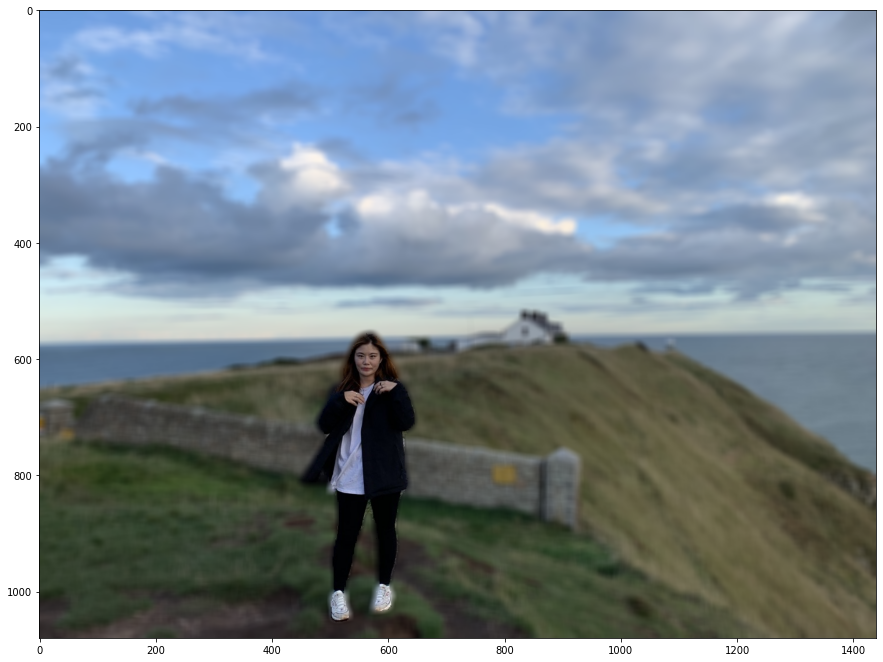

In [14]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

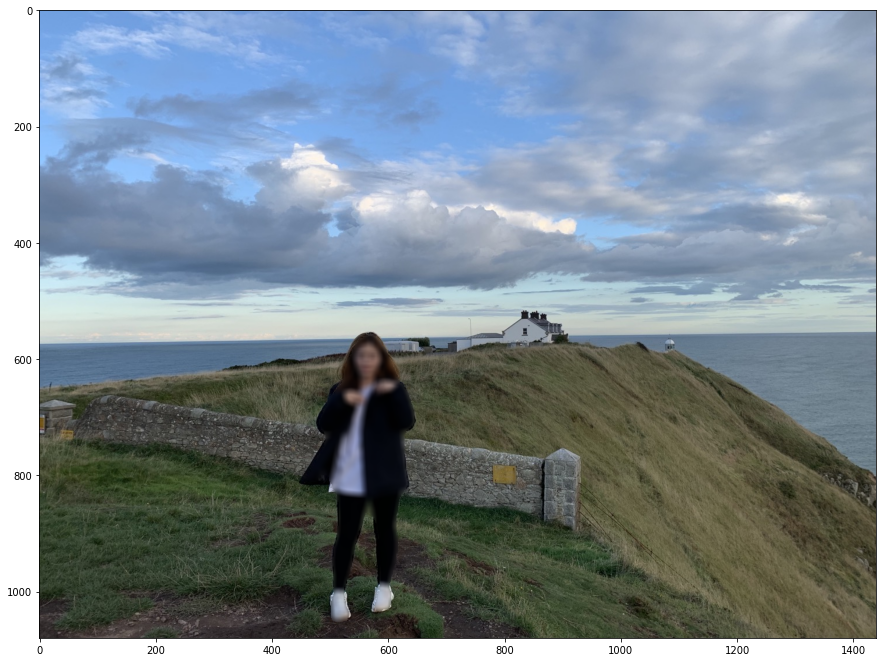

In [15]:
#이번에는 사람 부분을 블러로, 배경 부분을 원본으로 출력
#img_bg_blur 대신 img_orig_blur로 바꿔줌. 왜인지 몰라도 순서도 이렇게 써야했음.
img_concat1 = np.where(img_mask_color==255, img_orig_blur, img_orig)
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_concat1, cv2.COLOR_BGR2RGB))
plt.show()

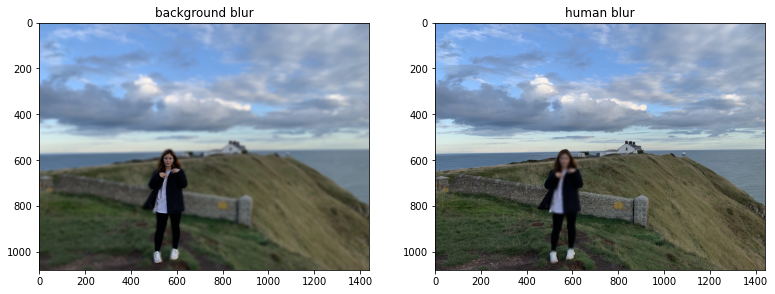

In [16]:

plt.figure(figsize=(13,13))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.title('background blur')

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(img_concat1, cv2.COLOR_BGR2RGB))
plt.title('human blur')

plt.show()

# 2. 동물 사진
과정은 'person'을 했을 때와 동일하다. 단지 데이터 라벨에 'dog'는 12번째에 있기에 이것만 바꿔주면 된다!

(1440, 1080, 3)


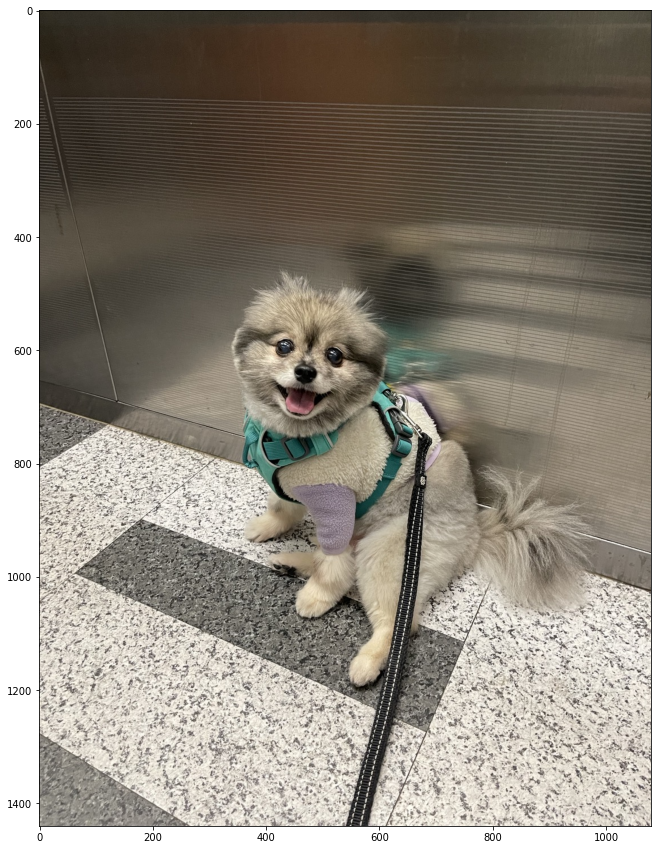

In [17]:
# os 모듈에 있는 getenv() 함수를 이용하여 읽고싶은 파일의 경로를 file_path에 저장
# 준비한 이미지 파일의 경로를 이용하여, 이미지 파일을 읽음
# cv2.imread(경로): 경로에 해당하는 이미지 파일을 읽어서 변수에 저장
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/dog1.jpeg'  
img_orig_dog = cv2.imread(img_path) 
print(img_orig_dog.shape)

plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_orig_dog, cv2.COLOR_BGR2RGB))
plt.show()

In [18]:
model = semantic_segmentation() #PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model.load_pascalvoc_model(model_file) # pascal voc에 대해 훈련된 예외 모델(model_file)을 로드하는 함수를 호출

segvalues, output = model.segmentAsPascalvoc(img_path)# segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용

In [19]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv' #'dog'는 여기서 12번째!
]
len(LABEL_NAMES)

21

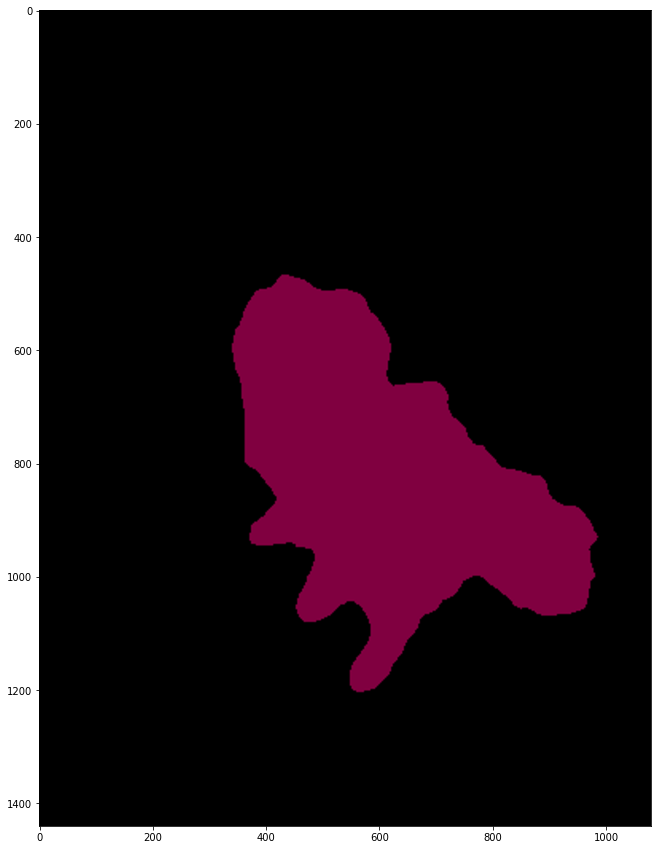

background
dog


In [20]:
#segmentAsPascalvoc() 함수 를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
plt.figure(figsize=(15,15))
plt.imshow(output)
plt.show()

segvalues # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 배열값을 출력

#segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

In [21]:
#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [22]:
colormap[12] #'dog'는 12번째

array([ 64,   0, 128])

In [23]:
seg_color = (128,0,64) #위에 나온 array를 RGB->BGR 순서로 반대로 작성해줌

(1440, 1080)


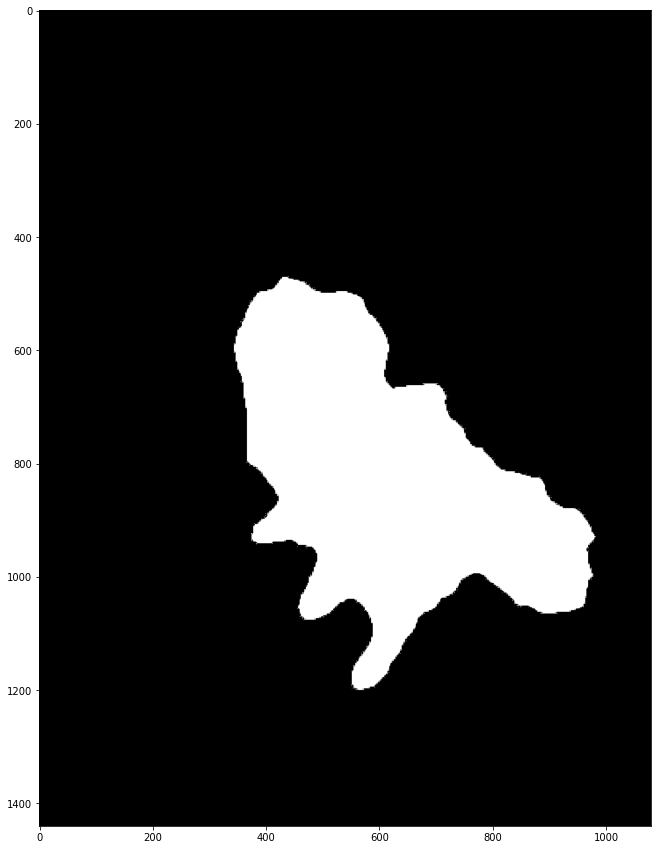

In [24]:
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape)
plt.figure(figsize=(15,15))
plt.imshow(seg_map, cmap='gray')
plt.show()

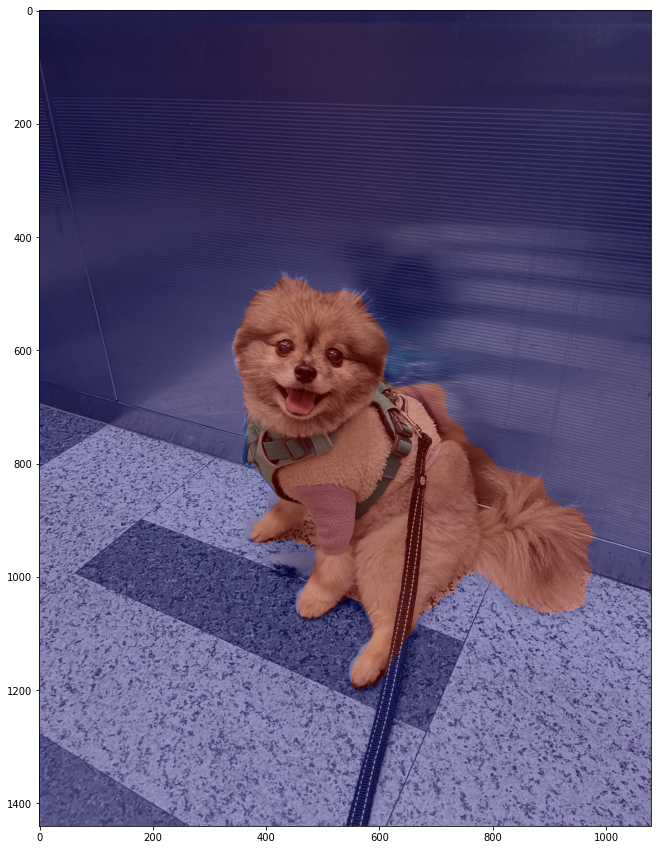

In [25]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig_dog.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

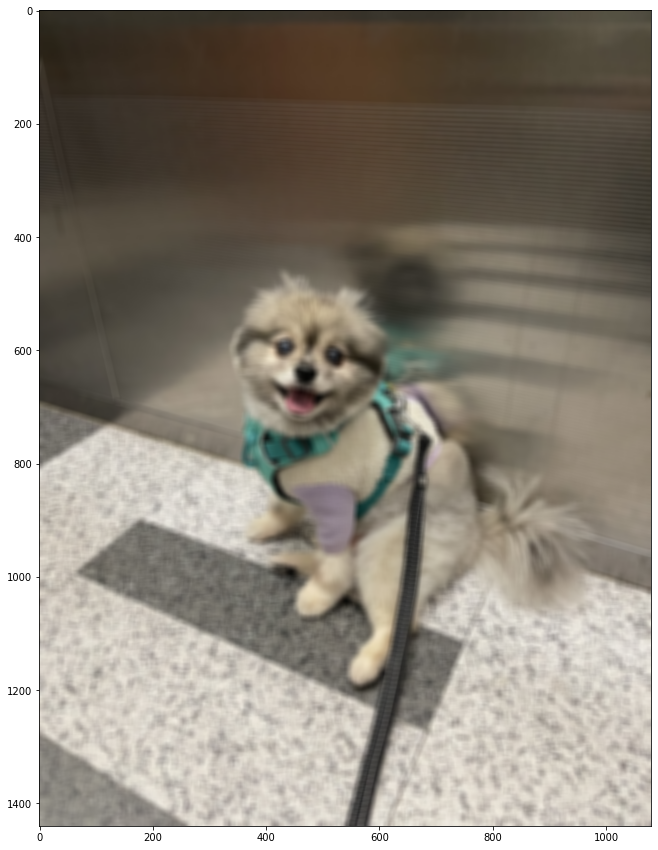

In [26]:
# (13,13)은 blurring kernel size를 뜻합니다
img_orig_blur = cv2.blur(img_orig_dog, (13,13))

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

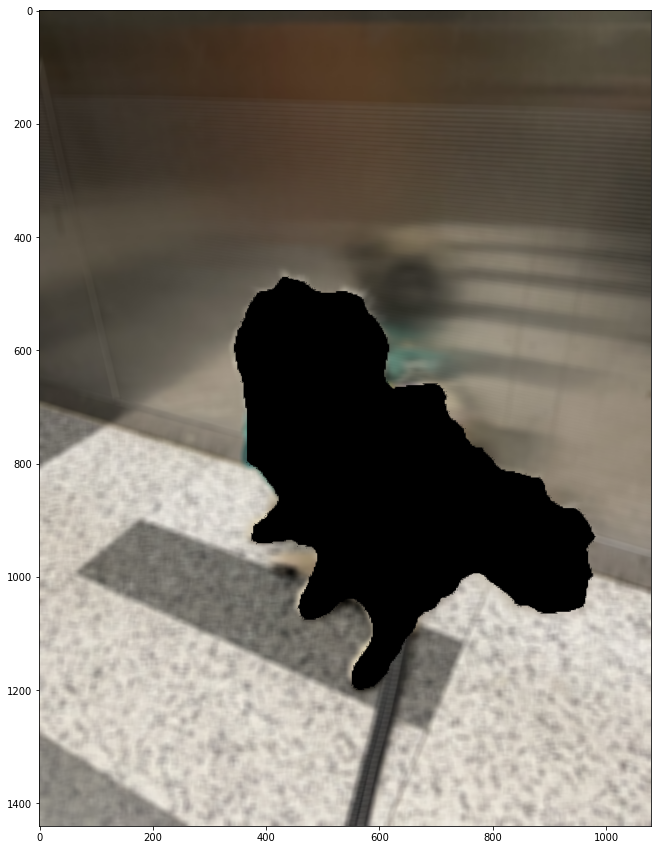

In [27]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

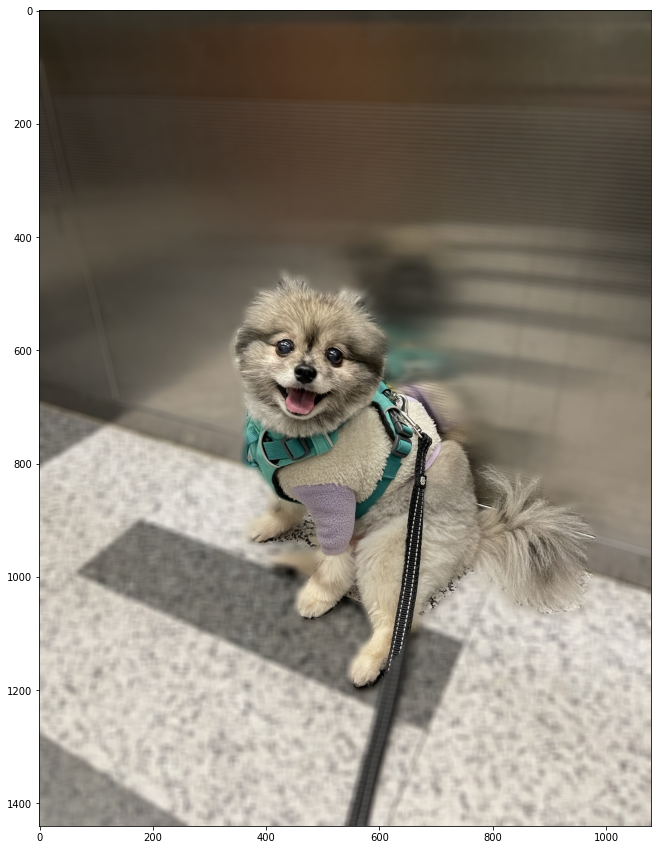

In [28]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig_dog, img_bg_blur)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

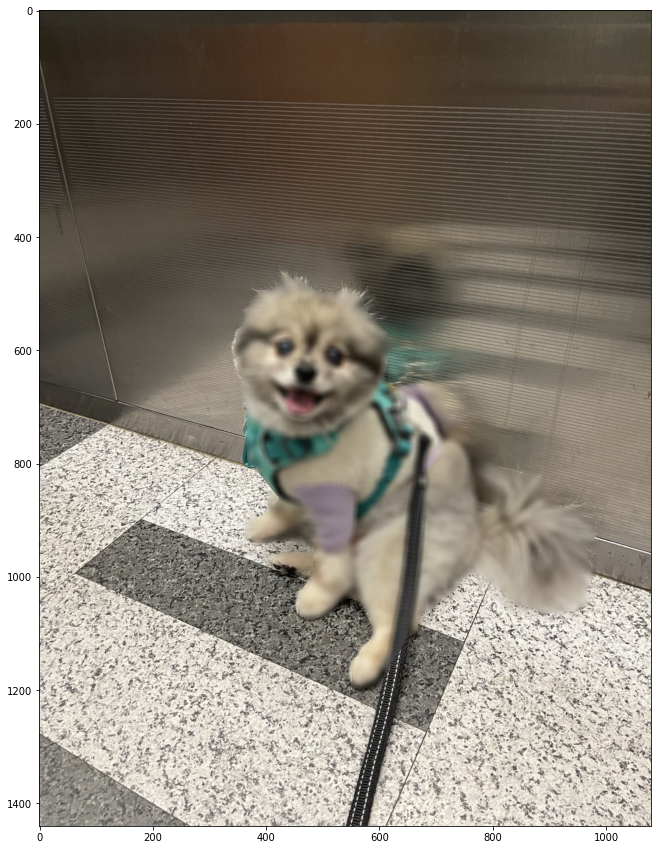

In [29]:
# Q. 이번에는 강아지 부분을 블러로, 배경 부분을 원본으로 출력해볼까요?
#img_bg_blur 대신 img_orig_blur로 바꿔줌.
img_concat1 = np.where(img_mask_color==255, img_orig_blur, img_orig_dog)
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_concat1, cv2.COLOR_BGR2RGB))
plt.show()

# 3. 배경전환 크로마키 사진

(952, 1446, 3)


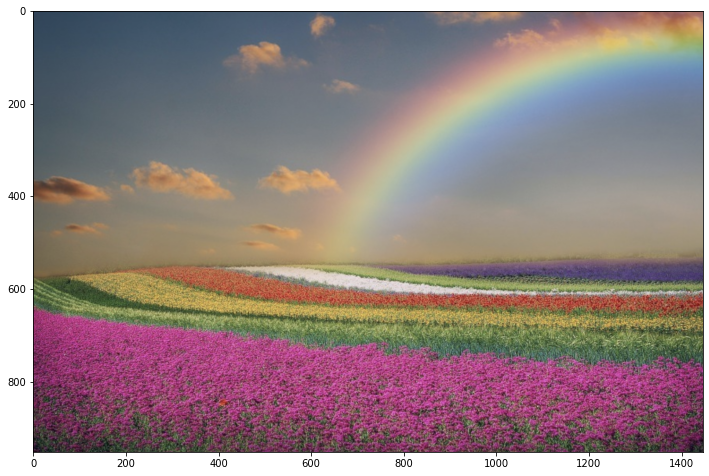

In [30]:
bg_img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/flower.png'  # 본인이 사용할 사진의 경로
bg_img_orig = cv2.imread(bg_img_path)
print(bg_img_orig.shape)

bg_img_rgb = cv2.cvtColor(bg_img_orig, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12,12))
plt.imshow(bg_img_rgb)
plt.show()

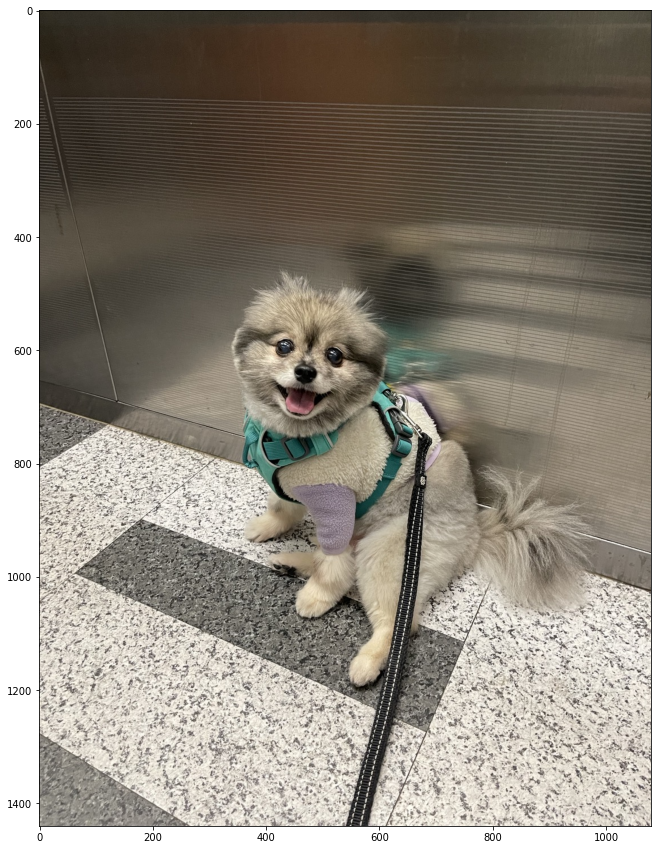

In [31]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/dog1.jpeg'  
img_orig_dog = cv2.imread(img_path) 

plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_orig_dog, cv2.COLOR_BGR2RGB))
plt.show()


In [32]:
target_size = (img_orig_dog.shape[1], img_orig_dog.shape[0])
bg_resized = cv2.resize(bg_img_orig, target_size)

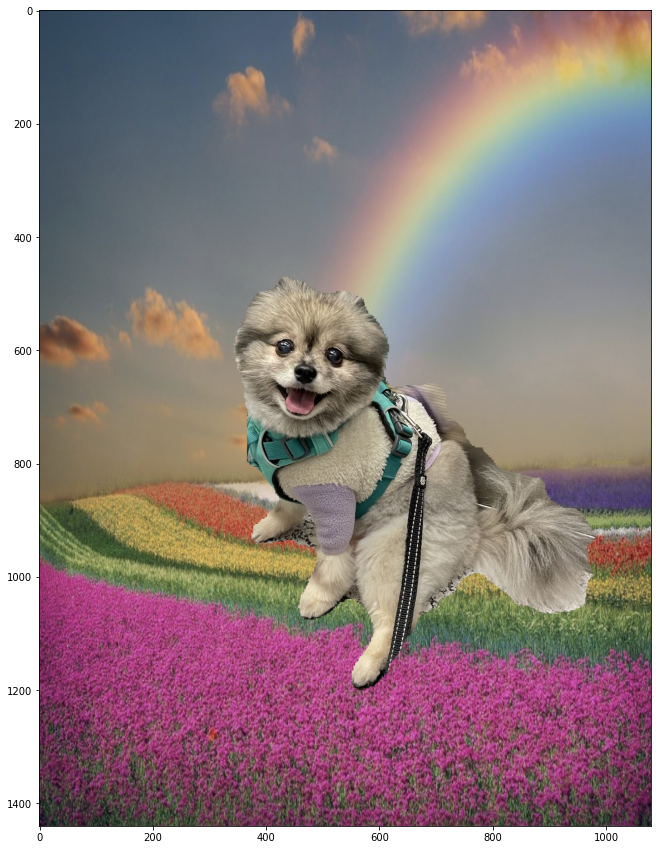

In [33]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_concat3 = np.where(img_mask_color==255, img_orig_dog, bg_resized)

plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_concat3, cv2.COLOR_BGR2RGB))
plt.show()

# 문제점

배경과 사람 부분이 완벽하게 나뉘어져서 블러처리가 되지 못했다. 특히 강아지 사진에는 바닥과 강아지와의 분리가 완전 애매하다..

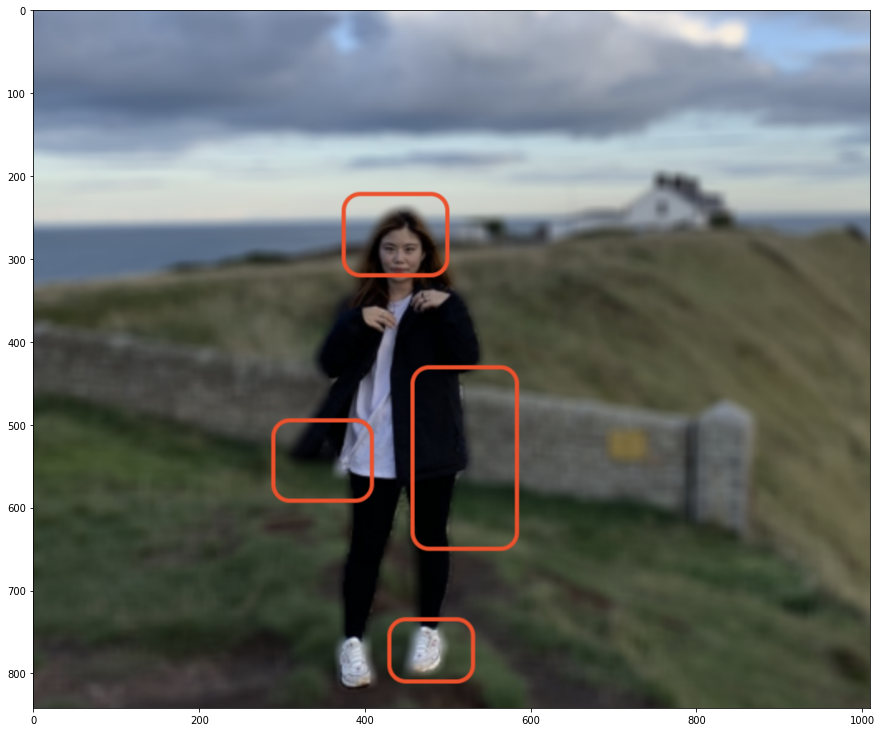

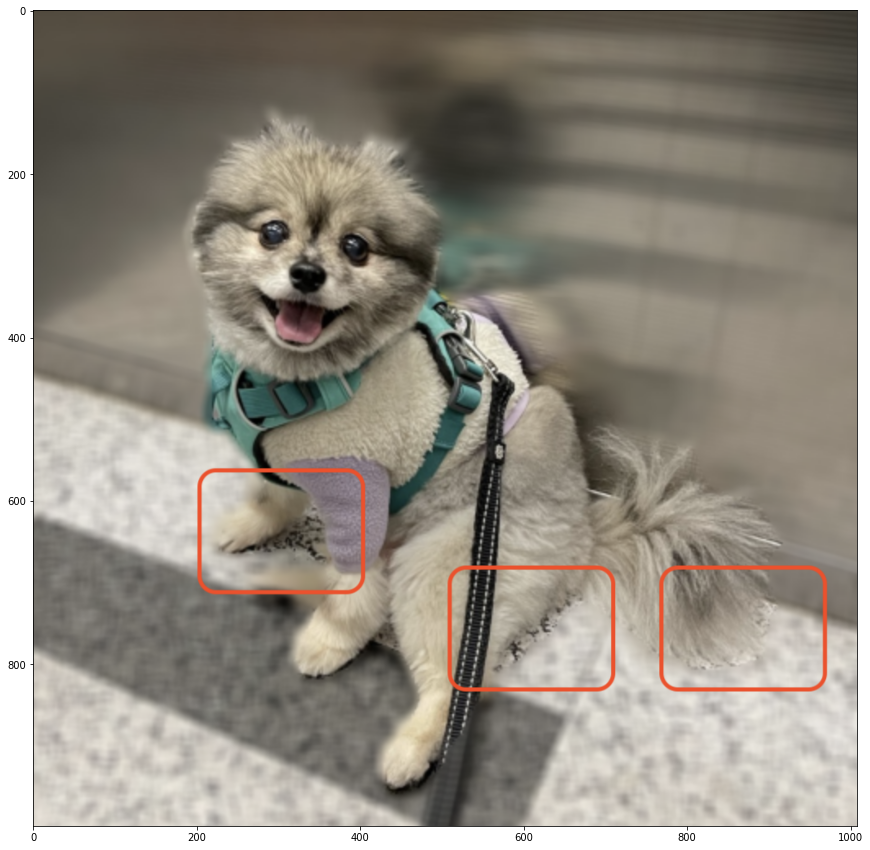

In [34]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/a.png' 
img_orig = cv2.imread(img_path) 

plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/b.png' 
img_orig_dog = cv2.imread(img_path) 

plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(img_orig_dog, cv2.COLOR_BGR2RGB))
plt.show()

## 회고



##서론

인물이나 동물 사진을 활용하여 아웃포커싱 효과를 적용시킨 인물모드 사진으로 만들어보고, 배경전환 크로마키 기법을 사용하며 발생한 문제점이나 오류에 대해 솔루션을 제공해보는 과제이다.

##개발 과정

사용하고자 하는 사진을 가져오고 model_url에 있는 파일을 다운로드 해서 model_file 파일명으로 저장한다.  urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해서 model_url 에 있는 파일을 다운로드 하고 model_file 로 저장한다. 그리고 cv2.COLOR_BGR2RGB 를 사용하여 BGR형식을 RGB 형식으로 변경한다. segmentAsPascalvoc()함수를 호출하여 입력된 이미지를 분할, 분할 출력의 배열을 가져온다. pascalvoc 데이터에 안에 21가지의 라벨 중 사람을 찾아낼 것이기에 ‘person’ 인 15영역을 검출한다. 이미지 분할 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력한다. 20개의 컬러맵을 만들고 15번째에 해당하는 배열을 seg_color에 넣어준다. 이 때 colormap 배열은 RGB 순이기에 BGR 순서인 반대로 넣어줘야 한다. 그리고 output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)가 나오게 된다. 사람이 있는 위치를 제외하고는 gray로 출력되게 해준다.  원본 이미지를 img_show에 할당하고 사람과 배경을 분리해서 표현한 color_mask를 만든 뒤 True과 False인 값을 각각 255와 0으로 바꿔준다. blur()함수를 사용하여 적절한 값을 사용해 블러처리를 해보고 적당히 흐려진 배경에 세그멘테이션 마스크를 이용해서 흐려진 배경만 추출한다. 여기서도 원본이 BGR순서로 픽셀을 읽으니 RGB형식으로 변경해주고 이미지를 반전시켜 배경이 0, 사람이 255였으나 연산을 하고나면 반대로 배경이 255, 사람이 0이 된다. 그리고 배경 영상과 사람 영상을 합치게 되면 사람이미지에 흐릿한 배경이 합성되어 출력된다. 
만약 반대로 사람을 흐리게 하고 싶다면 img_bg_blur 대신 img_orig_blur로 바꿔주게 되면 반대의 결과를 확인 할 수 있다. 
동물사진도 마찬가지로 똑같이 진행하지만 pascalvoc데이터의 라벨에서 강아지는 12번째에 있기 때문에 12값을 넣어주면 같은 결과를 볼 수 있다.  
강아지 사진에 배경을 바꿔보았는데 이땐 이미 검출해놓은 강아지를 배경사진을 불러와서 target_size를 맞추고 합쳤더니 간단하게 합성을 할 수 있었다.


##결과 및 토론

문제점들에 나와있는 결과물처럼 blur처리의 결과가 완벽하지는 못한 것을 알 수 있다. 특히나 세밀한 털이나 작은 부분, 또는 겹치는 부분은 세밀하게 잡아내는 데에는 한계가 있었다. Convolution 연산을 수행하면 연산량이 많아지게 되는데 이것들을 보완하기 위한 방법으로 PSPNet이나 UNet 또는 ROI Align 등의 방식들이 사용되기도 한다.
피사계심도를 이용한 보케(아웃포커싱) 효과는 말 그대로 심도를 표현하기 때문에 초점이 잡힌 거리를 광학적으로 아주 섬세하게 구별(segmentation) 하지만 이를 따라 한 semantic segmentation 모듈은 정확도가 1.00 이 되지 않는 한 완벽히 구현하기는 힘들다. 그래서 3D 이미지센서라는 것이 개발되고 있는데 기존 이미지센서는 2D 이미지만 구현할 수 있는 데 반해, 3D 이미지센서는 사물까지의 거리(심도)를 측정함으로써 더 정밀하게 물체나 동작을 인식해 이를 3D 이미지로 구현할 수 있다. 

##배운 점 및 회고

평소에 핸드폰으로 사용해 본 인물사진 촬영 모드를 내가 직접 객체를 빼서 합성해보는 과정이 너무나도 흥미로웠고 재밌었다. 결과물이 완벽하지는 않아서 조금 아쉬움이 남긴 하지만 segmentAsPascalvoc()함수를 호출하여 자동으로 객체를 인지 해내는 것이 너무나도 신기했고 더욱 복잡하고 정교한 사진일 경우 어떤 결과가 나올지 궁금했다. 시멘틱 세그멘테이션에 대해 이해하는데에 큰 도움이 되었고 인스턴스 세그멘테이션도 사용해보고 싶다는 생각을 했다. 아직 이미지를 분할 한 뒤 결과값을 배열화하는 부분에 대한 이해도가 좀 낮아서 추가적인 공부가 더 필요할 것 같다.
